# PC Session 4

**Author:**
[Helge Liebert](https://hliebert.github.io/)

# **Text analysis**: Brexit debate

### Libraries

In [1]:
library("twfy")
library("jsonlite")
library("topicmodels")
library("textclean")
library("wordcloud")
library("slam")
library("tm")
library("data.table")
library("tidytext")
library("stringr")
library("dplyr")
library("ggplot2")
library("ggrepel")
library("uwot")
library("udpipe")
library("lsa")
library("factoextra")
library("word2vec")
library("plotly")
library("fpc")

Loading required package: RColorBrewer

Loading required package: NLP


Attaching package: 'data.table'


The following object is masked from 'package:slam':

    rollup


Warning message:
"replacing previous import 'vctrs::data_frame' by 'tibble::data_frame' when loading 'dplyr'"

Attaching package: 'dplyr'


The following objects are masked from 'package:data.table':

    between, first, last


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



Attaching package: 'ggplot2'


The following object is masked from 'package:NLP':

    annotate


Loading required package: Matrix

Loading required package: SnowballC

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:stats':

    filter


T

### Get data from TheyWorkForYou API

In [2]:
apikey <- "G3WVqtBtKAbdGVqrd8BKajm8"
set_api_key(apikey)

call <- getDebates(type = "commons", search = "Brexit", num = 1000, page = 1)
info <- call$info
pages <- ceiling(info$total_results/info$results_per_page)

## Form of data.frame, header only
brexit.debates <- flatten(as.data.frame(call$rows))[0, ]

## read all pages of results
for (p in seq(1, pages)) {
  call <- getDebates(type = "commons",  search = "Brexit", num = 1000, page = p)
  call$rows$speaker$office <- NULL
  brexit.debates <- rbind(brexit.debates, flatten(as.data.frame(call$rows)))
}

## save to file
fwrite(brexit.debates, "Data/brexit-debates.csv")
saveRDS(brexit.debates, "Data/brexit-debates.rds")

## read from file
## brexit.debates <- readRDS("Data/brexit-debates.rds")

## str(brexit.debates)
## length(unique(brexit.debates$gid))
## length(unique(brexit.debates$hdate))
## length(unique(brexit.debates$person_id))
names(brexit.debates)

## copy before transformations
brexit.debates$body.orig <- brexit.debates$body

[1] "gid"                  "hdate"                "htime"               
 [4] "section_id"           "subsection_id"        "htype"               
 [7] "major"                "minor"                "person_id"           
[10] "hpos"                 "video_status"         "epobject_id"         
[13] "body"                 "collapsed"            "relevance"           
[16] "extract"              "listurl"              "speaker.member_id"   
[19] "speaker.name"         "speaker.house"        "speaker.constituency"
[22] "speaker.party"        "speaker.person_id"    "speaker.url"         
[25] "parent.body"

### Cleaning the text

Some cleaning and harmonizing, pre-written functions (e.g. library(textclean)) convenient compared to writing all regex on your own.

In [3]:
## brief check
## check_text(brexit.debates$body[1:100])
## Encoding(brexit.debates$body) <- "UTF-8"
head(brexit.debates$body)

[1] "<p pid=\"a132.2/1\">I am grateful to you, Madam Deputy Speaker, and to the Speaker&#8217;s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies.</p><p pid=\"a132.2/2\">In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close-knit community of Park Street in my constituency. What it means if it goes ahead is that 3.5 million square metres of green belt&#8212;the size of 490 football pitches&#8212;will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links.</p><p pid=\"a132.2/3\">Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government&#8217;s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all.</p><p pid=\"a132.2/4\">A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District Council needs to build more than 14,000 additional homes in the next 16 years &#8212;that is more than 900 homes per year. Thirdly, as well as accommodating almost 15,000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government&#8217;s housing targets, accept a freight interchange and protect the green belt. It is just not possible.</p><p pid=\"a132.2/5\">Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. He said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be &#8220;safe in our hands&#8221;. He even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in  2014 approved the freight terminal anyway&#8212;even while admitting the violation of the green belt in his official decision. In that decision, he said that this</p><p class=\"indent\" pid=\"a132.2/6\" pwmotiontext=\"yes\">&#8220;proposal would have a substantial impact on the openness of the Green Belt, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.&#8221;</p><p pid=\"a132.2/7\">Just a month ago, the Government published their White Paper, &#8220;Planning for the future&#8221;, and reiterated their commitment to protecting the green belt. So my first question to the G

In [4]:
brexit.debates$body <- replace_html(brexit.debates$body)
head(brexit.debates$body)

[1] " I am grateful to you, Madam Deputy Speaker, and to the Speaker&#8217;s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies.  In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close-knit community of Park Street in my constituency. What it means if it goes ahead is that 3.5 million square metres of green belt&#8212;the size of 490 football pitches&#8212;will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links.  Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government&#8217;s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all.  A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District Council needs to build more than 14,000 additional homes in the next 16 years &#8212;that is more than 900 homes per year. Thirdly, as well as accommodating almost 15,000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government&#8217;s housing targets, accept a freight interchange and protect the green belt. It is just not possible.  Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. He said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be &#8220;safe in our hands&#8221;. He even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in  2014 approved the freight terminal anyway&#8212;even while admitting the violation of the green belt in his official decision. In that decision, he said that this  &#8220;proposal would have a substantial impact on the openness of the Green Belt, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.&#8221;  Just a month ago, the Government published their White Paper, &#8220;Planning for the future&#8221;, and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their White Paper, &#8220;Planning for the future&#8221;, which commits to protecting the green belt, is it still Government policy to sacrifice 490 fo

In [5]:
brexit.debates$body <- replace_non_ascii(brexit.debates$body)
head(brexit.debates$body)

[1] "I am grateful to you, Madam Deputy Speaker, and to the Speaker&#8217;s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies. In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close-knit community of Park Street in my constituency. What it means if it goes ahead is that 3.5 million square metres of green belt&#8212;the size of 490 football pitches&#8212;will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links. Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government&#8217;s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all. A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District Council needs to build more than 14,000 additional homes in the next 16 years &#8212;that is more than 900 homes per year. Thirdly, as well as accommodating almost 15,000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government&#8217;s housing targets, accept a freight interchange and protect the green belt. It is just not possible. Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. He said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be &#8220;safe in our hands&#8221;. He even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in 2014 approved the freight terminal anyway&#8212;even while admitting the violation of the green belt in his official decision. In that decision, he said that this &#8220;proposal would have a substantial impact on the openness of the Green Belt, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.&#8221; Just a month ago, the Government published their White Paper, &#8220;Planning for the future&#8221;, and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their White Paper, &#8220;Planning for the future&#8221;, which commits to protecting the green belt, is it still Government policy to sacrifice 490 football p

In [6]:
brexit.debates$body <- gsub("&#8212;", " - ", brexit.debates$body)
head(brexit.debates$body)

[1] "I am grateful to you, Madam Deputy Speaker, and to the Speaker&#8217;s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies. In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close-knit community of Park Street in my constituency. What it means if it goes ahead is that 3.5 million square metres of green belt - the size of 490 football pitches - will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links. Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government&#8217;s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all. A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District Council needs to build more than 14,000 additional homes in the next 16 years  - that is more than 900 homes per year. Thirdly, as well as accommodating almost 15,000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government&#8217;s housing targets, accept a freight interchange and protect the green belt. It is just not possible. Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. He said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be &#8220;safe in our hands&#8221;. He even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in 2014 approved the freight terminal anyway - even while admitting the violation of the green belt in his official decision. In that decision, he said that this &#8220;proposal would have a substantial impact on the openness of the Green Belt, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.&#8221; Just a month ago, the Government published their White Paper, &#8220;Planning for the future&#8221;, and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their White Paper, &#8220;Planning for the future&#8221;, which commits to protecting the green belt, is it still Government policy to sacrifice 490 football pitches-worth of 

In [7]:
brexit.debates$body <- gsub("&#[0-9]{3,4};", " ", brexit.debates$body)
head(brexit.debates$body)

[1] "I am grateful to you, Madam Deputy Speaker, and to the Speaker s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies. In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close-knit community of Park Street in my constituency. What it means if it goes ahead is that 3.5 million square metres of green belt - the size of 490 football pitches - will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links. Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all. A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District Council needs to build more than 14,000 additional homes in the next 16 years  - that is more than 900 homes per year. Thirdly, as well as accommodating almost 15,000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government s housing targets, accept a freight interchange and protect the green belt. It is just not possible. Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. He said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be  safe in our hands . He even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in 2014 approved the freight terminal anyway - even while admitting the violation of the green belt in his official decision. In that decision, he said that this  proposal would have a substantial impact on the openness of the Green Belt, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.  Just a month ago, the Government published their White Paper,  Planning for the future , and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their White Paper,  Planning for the future , which commits to protecting the green belt, is it still Government policy to sacrifice 490 football pitches-worth of green belt for a monster lorry and rail park on this site? The Gov

In [8]:
brexit.debates$body <- replace_names(brexit.debates$body)
head(brexit.debates$body)

[1] "I am grateful to you, Madam  Speaker, and to the Speaker s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies. In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close - knit community of   in my constituency. What it means if it goes ahead is that 3. 5 million square metres of green belt - the size of 490 football pitches - will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links. Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all. A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District  needs to build more than 14, 000 additional homes in the next 16 years - that is more than 900 homes per year. Thirdly, as well as accommodating almost 15, 000 homes on the green belt, the Government also want to build this massive interchange, the size of 490 football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government s housing targets, accept a freight interchange and protect the green belt. It is just not possible. Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area.  said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be safe in our hands.  even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in 2014 approved the freight terminal anyway - even while admitting the violation of the green belt in his official decision. In that decision, he said that this proposal would have a substantial impact on the openness of the, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans.  a month ago, the Government published their  Paper, Planning for the future, and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their  Paper, Planning for the future, which commits to protecting the green belt, is it still Government policy to sacrifice 490 football pitches - worth of green belt for a monster lorry and rail park on this site? The Government changed course in 2014 and they can, and must,

In [9]:
brexit.debates$body <- replace_money(brexit.debates$body, replacement = "MONEYHERE")
brexit.debates$body <- replace_date(brexit.debates$body, replacement = "DATEHERE")
brexit.debates$body <- replace_ordinal(brexit.debates$body, num.paste = TRUE)
brexit.debates$body <- replace_number(brexit.debates$body, remove = TRUE) ## makes a difference for topics!
brexit.debates$body <- add_comma_space(brexit.debates$body)
brexit.debates$body <- replace_contraction(brexit.debates$body)
brexit.debates$body <- replace_white(brexit.debates$body)
head(brexit.debates$body)

[1] "I am grateful to you, Madam Speaker, and to the Speaker s Office for helping me to secure this debate on the first day back. This debate is of vital importance to my constituents in St Albans and indeed in the neighbouring and nearby constituencies. In 2014, the then Secretary of State for Communities and Local Government decided that a hugely damaging strategic rail freight interchange should be built on the site of the former Radlett Aerodrome, next to the small close - knit community of in my constituency. What it means if it goes ahead is that 3. million square metres of green belt - the size of football pitches - will be converted into a massive rail and lorry park with warehouses, lorries, container storage, HGV parking and so on. It will bring thousands of heavy goods vehicles per day, and huge disruption to the surrounding roads and commuter rail links. Although that decision was made in 2014, it has suddenly been thrown back into the limelight because our local council is now being held hostage by this Government s planning system. In effect, the council has been told by planning inspectors to drop its opposition to the monstrosity of a freight terminal or Whitehall will take away its powers to decide where to build homes. That is no choice at all. A freight terminal in this location has always been a bad idea, but there are also new and compelling reasons why it should be reviewed and why the plans for the freight terminal should scrapped. Let us start with what the Government have told the people of St Albans so far. First, the Government say that they want to protect the green belt. That is great, but almost all of St Albans district is designated green belt. Secondly, the Government also say that St Albans District needs to build more than 14, additional homes in the next years - that is more than homes per year. Thirdly, as well as accommodating almost 15, homes on the green belt, the Government also want to build this massive interchange, the size of football pitches, on the green belt. So here is the rub: it is simply not possible to meet the Government s housing targets, accept a freight interchange and protect the green belt. It is just not possible. Let us start with the green belt. As I have said, most of the St Albans district is green belt land. Every new strategic site identified for new development has to be evaluated to ensure that it does the least damage to the green belt. Initially, a decade ago, the Conservative Secretary of State for Communities and Local Government said that the terminals did not fit with the development plan in the area. said that it was inappropriate to build a freight interchange on the green belt, and on behalf of the Conservative Government he said that the green belt would be safe in our hands. even highlighted the likely harm it would cause to the landscape and ecology. But after controversial lobbying of the Department by the developer, which was the subject of a complaint to the Cabinet Secretary by my predecessor, and despite his own objections, he went ahead, and in approved the freight terminal anyway - even while admitting the violation of the green belt in his official decision. In that decision, he said that this proposal would have a substantial impact on the openness of the, that it would result in significant encroachment into the countryside, that it would contribute to urban sprawl and that it would cause some harm to the setting of St Albans. a month ago, the Government published their Paper, Planning for the future, and reiterated their commitment to protecting the green belt. So my first question to the Government tonight is: in the light of their Paper, Planning for the future, which commits to protecting the green belt, is it still Government policy to sacrifice football pitches - worth of green belt for a monster lorry and rail park on this site? The Government changed course in and they can, and must, change course again. Let us turn to the local p

In [10]:
## remove blanks
## brexit.debates <- brexit.debates[brexit.debates$body != "", ]

### Topics, both parties

In [11]:
## Corpus
## corp <- brexit.debates
corp <- brexit.debates[, c("gid", "body")]
setnames(corp, "gid", "doc_id")
setnames(corp, "body", "text")

## initialize dtm
dtm <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp
  )),
  control = list(
    language = "english",
    ## weighting = weightTfIdf,
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)

## checks
inspect(dtm)
## findFreqTerms(dtm, lowfreq = 10)
findFreqTerms(dtm, lowfreq = 1000)
## dtm <- removeSparseTerms(dtm, sparse=0.90) ## filter some
dtm <- dtm[row_sums(dtm) > 0, ] ## documents can't be empty

<<DocumentTermMatrix (documents: 2972, terms: 20507)>>
Non-/sparse entries: 347340/60599464
Sparsity           : 99%
Maximal term length: 22
Weighting          : term frequency (tf)
Sample             :
                    Terms
Docs                 brexit can government hon member minister people right
  2017-01-20a.1218.0      3   8         10  38     25        0     14     6
  2017-03-06a.638.0       1   7         10  28     22        0      6    11
  2017-12-01a.660.1       1  10          6   0      0       10      6     1
  2018-06-11a.681.2       2   8          4  12     12        2     33    11
  2018-10-29a.653.2       1  26         16  14      7        1     30    12
  2019-01-08b.287.4       3   0          8   0      0        0      0     0
  2019-03-06c.1034.0      2   6          8   9      9        1     10    11
  2020-01-08d.492.1       1   0         29   0      1       16      1     1
  2020-03-05b.1058.0      1   5         12   2      2        0     10     2
  2020-03-1

[1] "also"       "brexit"     "can"        "debate"     "first"     
 [6] "government" "just"       "made"       "make"       "many"      
[11] "minister"   "must"       "need"       "new"        "now"       
[16] "one"        "people"     "said"       "say"        "secretary" 
[21] "state"      "take"       "want"       "will"       "work"      
[26] "year"       "years"      "hon"        "important"  "last"      
[31] "member"     "place"      "right"      "time"       "country"   
[36] "deal"       "public"     "support"    "trade"      "know"      
[41] "members"    "get"        "union"      "today"      "european"

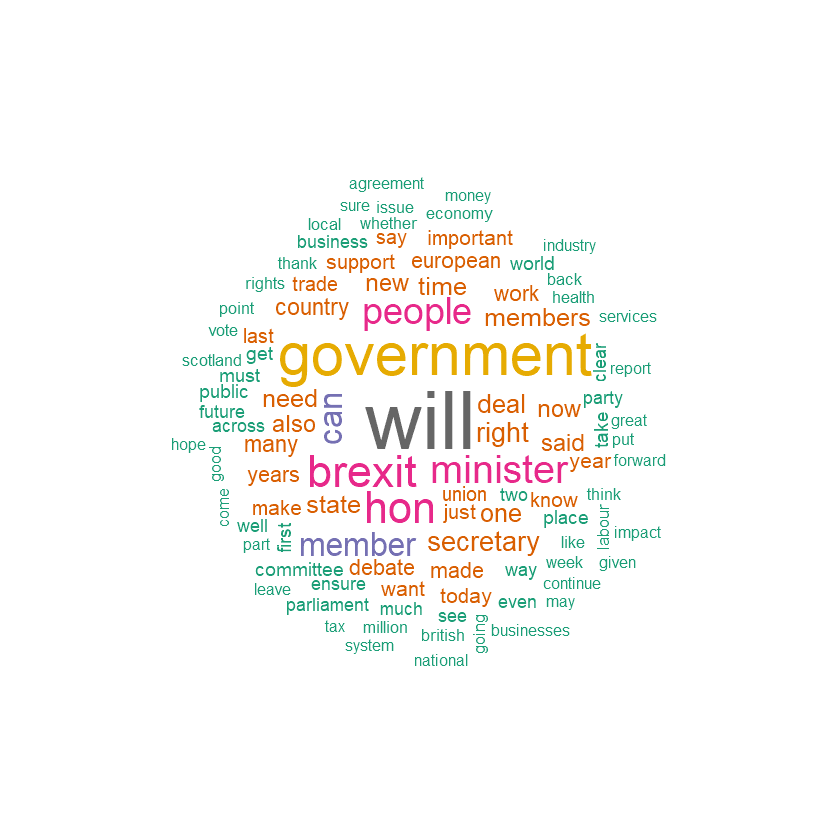

In [12]:
## Simple visualization
## wordcloud(brexit.debates$body, max.words = 100, random.order = FALSE,
##          colors = brewer.pal(8, "Dark2"))

## same plot, works with both tf and tf-idf weighting
counts <- sort(colSums(as.matrix(dtm)), decreasing = TRUE)
counts <- data.frame(word = names(counts), freq = counts)
wordcloud(words = counts$word, freq = counts$freq,
          max.words = 100, random.order = FALSE,
          colors = brewer.pal(8, "Dark2"))

Topic 1,Topic 2,Topic 3
hon,will,will
will,brexit,government
member,government,people
members,minister,brexit
people,deal,can
right,secretary,need
government,state,year
can,european,minister
debate,can,tax
also,union,new


$`Topic 1`
 [1] "important"   "committee"   "place"       "issue"       "think"      
 [6] "legislation" "way"         "first"       "must"        "hope"       
[11] "point"       "well"        "see"         "ensure"      "world"      
[16] "act"         "women"       "issues"      "take"        "like"       

$`Topic 2`
 [1] "deal"         "european"     "union"        "trade"        "vote"        
 [6] "agreement"    "parliament"   "week"         "negotiations" "clear"       
[11] "future"       "leave"        "british"      "party"        "scotland"    
[16] "statement"    "scottish"     "post"         "thank"        "united"      
[21] "two"          "agree"       

$`Topic 3`
 [1] "year"       "tax"        "million"    "economy"    "public"    
 [6] "local"      "billion"    "funding"    "health"     "services"  
[11] "businesses" "investment" "nhs"        "sector"     "care"      
[16] "money"      "social"     "budget"     "even"       "pay"       
[21] "system"     "get"

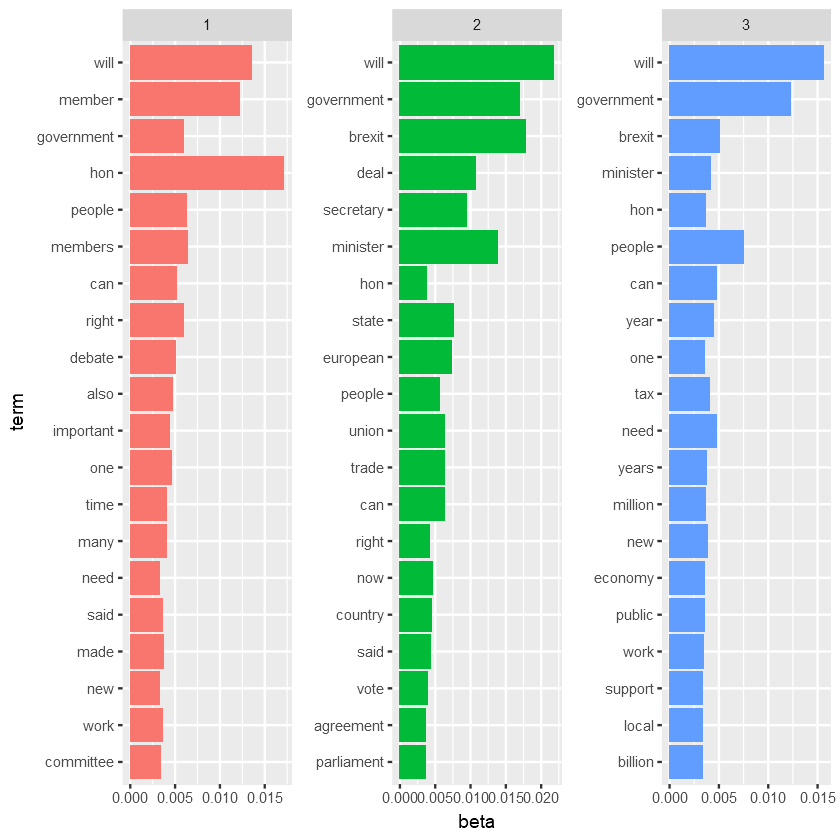

In [13]:
## Unsupervised clustering of documents: Topic model
tpm <- LDA(dtm, k = 3, control = list(seed = 100))
topic <- topics(tpm, 1)
freqterms <- terms(tpm, 50)
freqterms

## Plot most frequent terms and associated probabilities by topic
tpmat <- tidy(tpm, matrix = "beta")
topterms <-
    tpmat %>%
    group_by(topic) %>%
    top_n(20, beta) %>%
    ungroup() %>%
    arrange(topic, -beta)
topterms %>%
    mutate(term = reorder(term, beta)) %>%
    ggplot(aes(term, beta, fill = factor(topic))) +
    geom_col(show.legend = FALSE) +
    facet_wrap(~ topic, scales = "free") +
    coord_flip()

## look at unique terms only per topic
duplicates <- c(freqterms)[duplicated(c(freqterms))]
distinctterms <- lapply(as.list(as.data.frame(freqterms)), function(x) x[!(x %in% duplicates)])
## distinctterms <- as.data.frame(distinctterms)
distinctterms



### Conservative Party Topics

In [14]:
## differences by party?
table(brexit.debates$speaker.party)


                          Alliance                       Conservative 
                                 2                                991 
                               DUP                              Green 
                                39                                  4 
                       Independent                             Labour 
                                37                                958 
               Labour/Co-operative                   Liberal Democrat 
                               171                                102 
                       Plaid Cymru            Scottish National Party 
                                37                                578 
Social Democratic and Labour Party                            Speaker 
                                14                                 10 
                               UUP 
                                 4 

Topic 1,Topic 2,Topic 3
hon,will,will
will,hon,brexit
member,government,hon
right,people,government
members,new,right
can,can,deal
debate,brexit,european
people,local,people
important,right,can
also,economy,minister


$`Topic 1`
 [1] "place"  "know"   "issue"  "rights" "spoke"  "sure"   "good"   "hope"  
 [9] "point"  "much"   "think"  "thank"  "across" "like"   "great"  "raised"

$`Topic 2`
 [1] "local"      "economy"    "nhs"        "year"       "business"  
 [6] "businesses" "billion"    "million"    "tax"        "health"    
[11] "budget"     "public"     "funding"    "investment" "system"    
[16] "money"      "care"       "sector"     "small"     

$`Topic 3`
 [1] "deal"         "european"     "union"        "trade"        "committee"   
 [6] "leave"        "agreement"    "vote"         "state"        "secretary"   
[11] "negotiations" "parliament"   "clear"        "agree"        "referendum"  
[16] "continue"     "post"         "united"

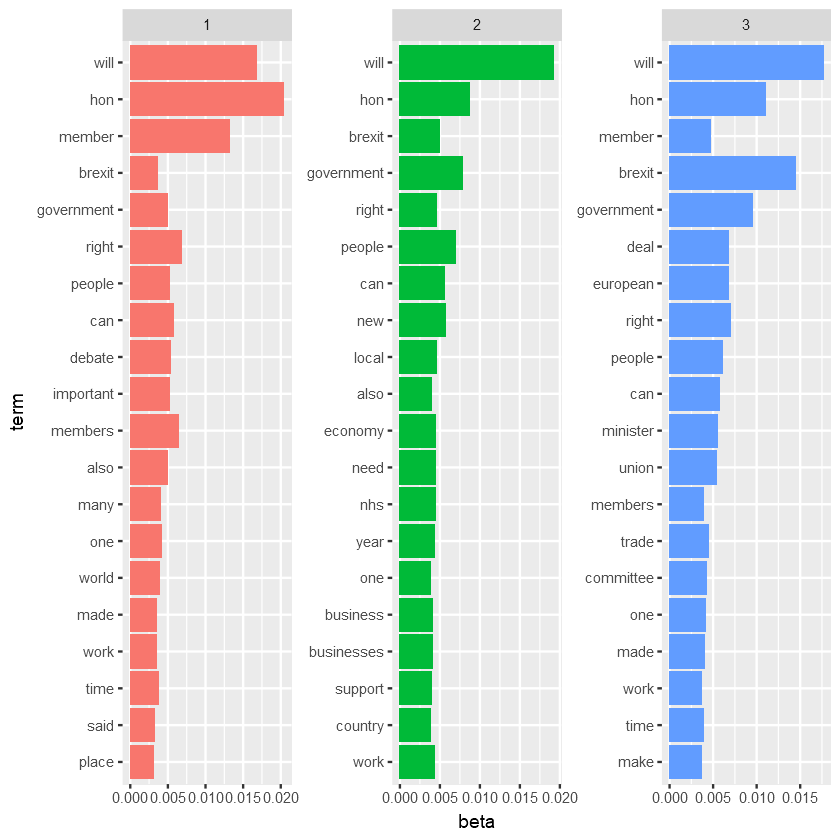

In [15]:
dtm.con <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp[brexit.debates$speaker.party == "Conservative" ,]
  )),
  control = list(
    language = "english",
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)
dtm.con <- dtm.con[row_sums(dtm.con) > 0, ] ## documents can't be empty

tpm.con <- LDA(dtm.con, k = 3, control = list(seed = 100))
topic.con <- topics(tpm.con, 1)
freqterms.con <- terms(tpm.con, 50)
freqterms.con

## Plot most frequent terms and associated probabilities by topic
tpmat.con <- tidy(tpm.con, matrix = "beta")
topterms.con <-
    tpmat.con %>%
    group_by(topic) %>%
    top_n(20, beta) %>%
    ungroup() %>%
    arrange(topic, -beta)
topterms.con %>%
    mutate(term = reorder(term, beta)) %>%
    ggplot(aes(term, beta, fill = factor(topic))) +
    geom_col(show.legend = FALSE) +
    facet_wrap(~ topic, scales = "free") +
    coord_flip()

## look at unique terms only per topic
duplicates.con <- c(freqterms.con)[duplicated(c(freqterms.con))]
distinctterms.con <- lapply(as.list(as.data.frame(freqterms.con)), function(x) x[!(x %in% duplicates.con)])
distinctterms.con

### Labour Party Topics

Topic 1,Topic 2,Topic 3
will,will,will
minister,government,government
government,people,minister
brexit,hon,secretary
deal,member,brexit
secretary,need,said
can,one,state
country,years,can
state,many,hon
trade,also,people


$`Topic 1`
 [1] "industry"     "economy"      "future"       "jobs"         "labour"      
 [6] "sector"       "clear"        "british"      "britain"      "strategy"    
[11] "businesses"   "world"        "investment"   "negotiations" "party"       
[16] "market"      

$`Topic 2`
 [1] "children"     "social"       "work"         "health"       "education"   
 [6] "funding"      "local"        "million"      "public"       "care"        
[11] "constituency" "services"     "food"         "money"        "important"   
[16] "since"        "women"        "cuts"         "even"         "well"        
[21] "much"        

$`Topic 3`
 [1] "vote"        "parliament"  "committee"   "statement"   "week"       
 [6] "rights"      "agreement"   "report"      "say"         "business"   
[11] "thank"       "whether"     "take"        "speaker"     "opposition" 
[16] "act"         "place"       "legislation"

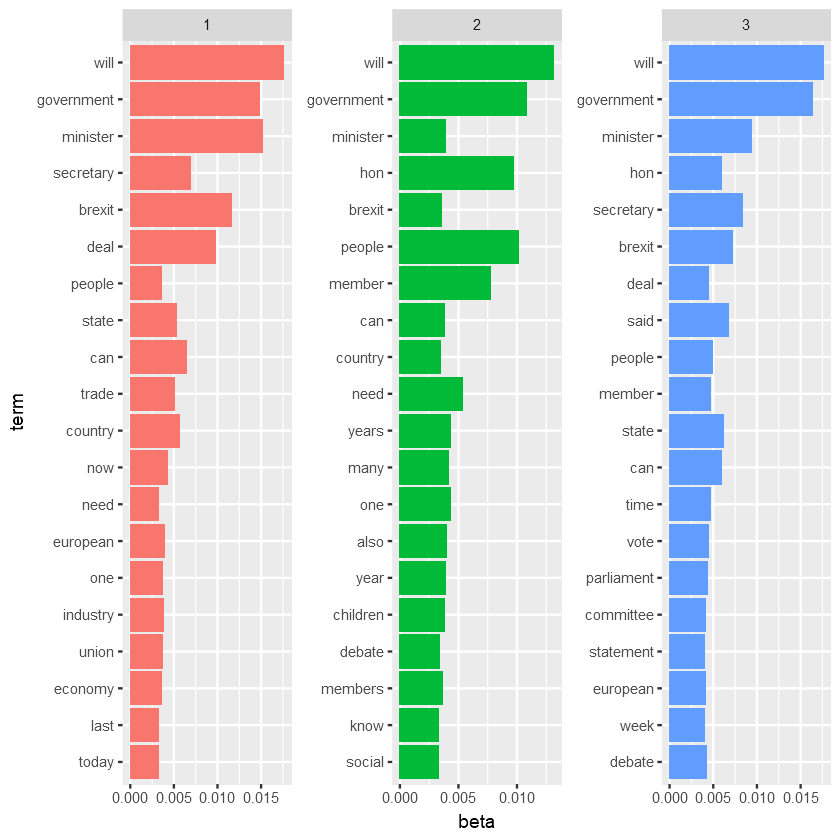

In [16]:
dtm.lab <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp[brexit.debates$speaker.party == "Labour", ]
  )),
  control = list(
    language = "english",
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)
dtm.lab <- dtm.lab[row_sums(dtm.lab) > 0, ] ## documents can't be empty


tpm.lab <- LDA(dtm.lab, k = 3, control = list(seed = 100))
topic.lab <- topics(tpm.lab, 1)
freqterms.lab <- terms(tpm.lab, 50)
freqterms.lab

## Plot most frequent terms and associated probabilities by topic
tpmat.lab <- tidy(tpm.lab, matrix = "beta")
topterms.lab <-
    tpmat.lab %>%
    group_by(topic) %>%
    top_n(20, beta) %>%
    ungroup() %>%
    arrange(topic, -beta)
topterms.lab %>%
    mutate(term = reorder(term, beta)) %>%
    ggplot(aes(term, beta, fill = factor(topic))) +
    geom_col(show.legend = FALSE) +
    facet_wrap(~ topic, scales = "free") +
    coord_flip()

## look at unique terms only per topic
duplicates.lab <- c(freqterms.lab)[duplicated(c(freqterms.lab))]
distinctterms.lab <- lapply(as.list(as.data.frame(freqterms.lab)), function(x) x[!(x %in% duplicates.lab)])
distinctterms.lab

### PCA/LSA

Since pca works less well for word similarity tasks and interpretations compared to other embeddings (when applied to the term-term matrix), lets apply it to the document-term-matrix.

We aggregate the document-term matrix by speaker, then use pca/lsa to get a reduced dimension that helps assessing document similarity. Then we use the smaller representation to apply k-means clustering to group politicians.

In [17]:
## check speakers and aggregate
## names(brexit.debates)
## length(unique((brexit.debates$speaker.name)))
## length(unique((brexit.debates$person_id)))
## nrow(unique((brexit.debates[, c("person_id", "speaker.party")])))

## aggregate, in base (more convenient with data.table; or dplyr if you must)
## brexit.speakers <- aggregate(body ~ speaker.name + person_id + speaker.party, data = brexit.debates, paste)
brexit.speakers <- aggregate(body ~ speaker.name + person_id, data = brexit.debates, paste)

## dismiss those who have empty text
brexit.speakers <- brexit.speakers[brexit.speakers$body != "", ]
brexit.speakers <- brexit.speakers[!is.na(brexit.speakers$body), ]

## checks
## dim(brexit.speakers)
## names(brexit.speakers)
## str(brexit.speakers)
## head(brexit.speakers)

## corpus base
corp <- brexit.speakers[, c("speaker.name", "body")]
setnames(corp, "speaker.name", "doc_id")
setnames(corp, "body", "text")

## initialize dtm
dtm <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp
  )),
  control = list(
    language = "english",
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)

inspect(dtm)

<<DocumentTermMatrix (documents: 617, terms: 20594)>>
Non-/sparse entries: 252901/12453597
Sparsity           : 98%
Maximal term length: 22
Weighting          : term frequency (tf)
Sample             :
                 Terms
Docs              brexit can government hon member minister people right
  Alison Thewliss     39  26         68  23     17       29     56     9
  Andrea Leadsom      48  39         68 161     26       27     25    42
  Anneliese Dodds     17  17         92  78     68       33     22    13
  Jeremy Corbyn      160 143        303  19     23      530    133    39
  Jim Shannon         17  55         23  29     22       51     35    22
  Keir Starmer        36  24         97   9      6       47      5     9
  Kirsty Blackman     40  39        123   9      6       18     29     3
  Pete Wishart       109  62        126  59     36       78     33    49
  Rupa Huq            23  21         44  23     21       17     52    15
  Valerie Vaz        106 155        438 249  

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    103    1203    4980    9812   11606  313608 

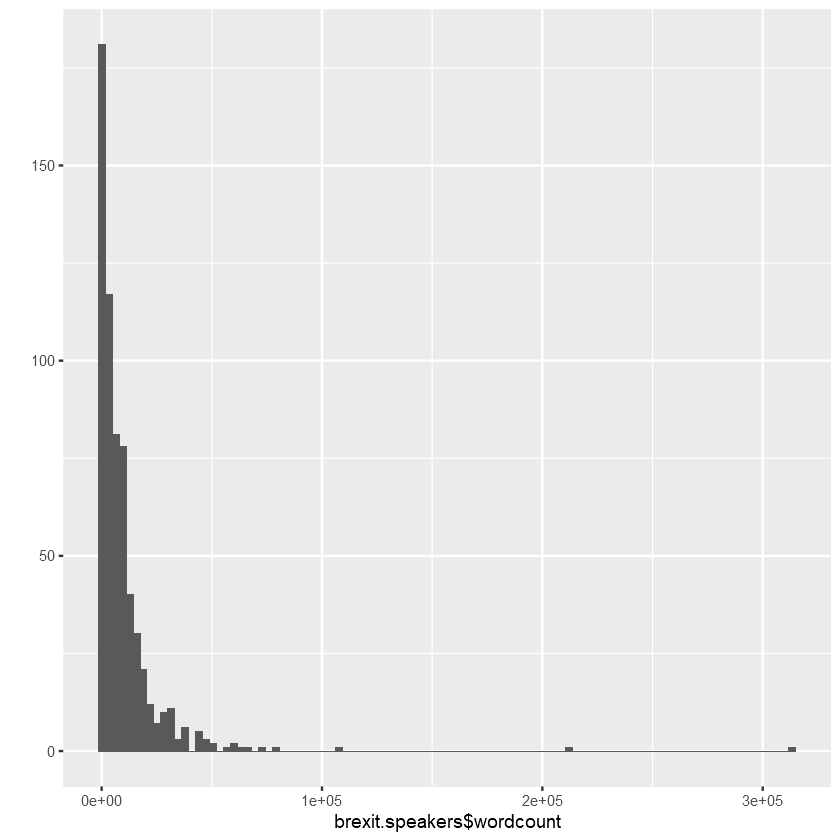

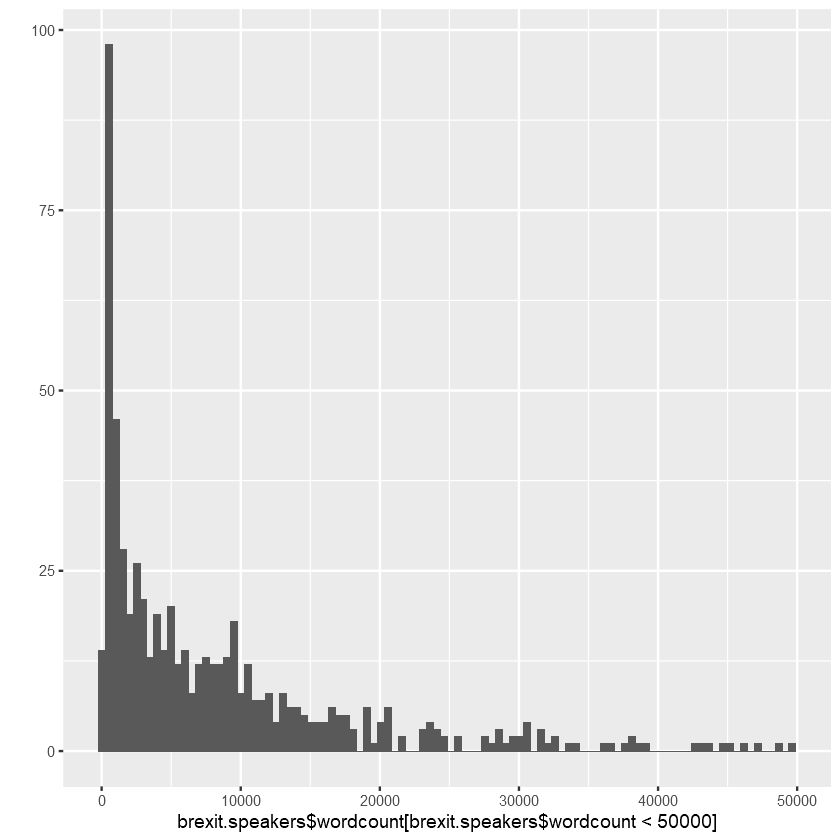

In [18]:
## how many words?
brexit.speakers$wordcount <- str_count(as.character(brexit.speakers$body))
summary(brexit.speakers$wordcount)
qplot(brexit.speakers$wordcount, bins = 100)
qplot(brexit.speakers$wordcount[brexit.speakers$wordcount < 50000], bins = 100)


In [19]:
## LSA on the document term matrix
## ls <- lsa(dtm)
ls <- lsa(dtm, 2)
str(ls)
pcs <- as.data.frame(ls$tk)

## if you want to recoup a matrix of the original dimensions
M <- as.textmatrix(ls)

List of 3
 $ tk: num [1:617, 1:2] -0.03008 -0.02024 -0.05787 -0.00803 -0.01352 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:617] "Diane Abbott" "Sir David Amess" "John Bercow" "Paul Beresford" ...
  .. ..$ : NULL
 $ dk: num [1:20594, 1:2] -8.46e-04 -1.65e-05 -4.95e-05 -1.88e-02 -4.73e-03 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:20594] "abandon" "aberration" "abi" "able" ...
  .. ..$ : NULL
 $ sk: num [1:2] 1825 602
 - attr(*, "class")= chr "LSAspace"


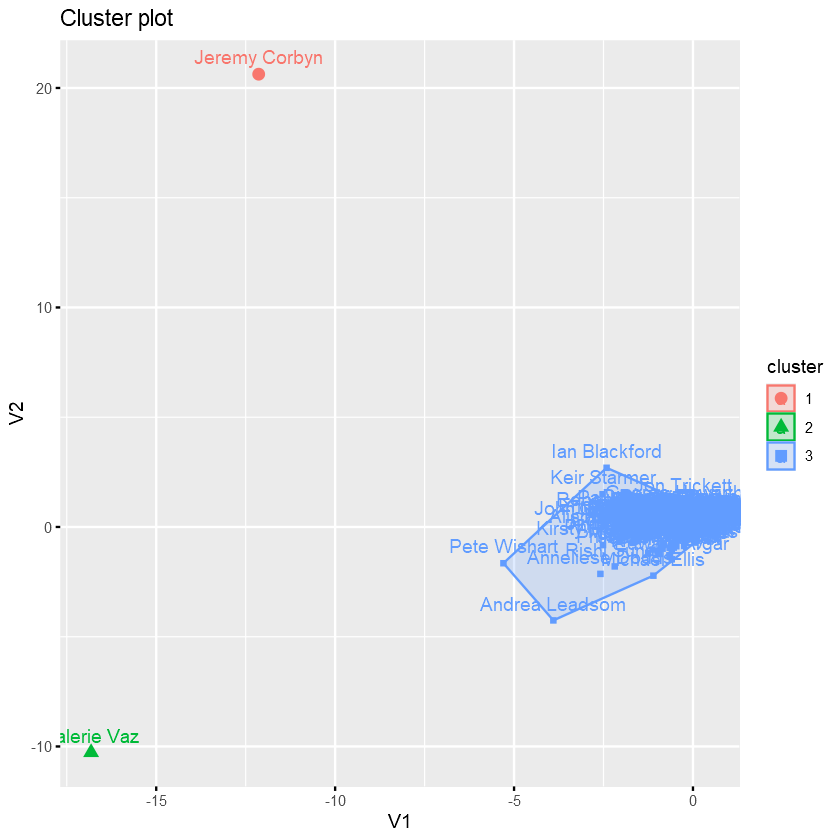

In [20]:
## kmeans clustering. Try three clusters (three main parties)
km <- kmeans(pcs, centers = 3)
## km
## str(km)
fviz_cluster(km, data = pcs)

In [21]:
## checks
summary(brexit.speakers$wordcount)
brexit.speakers[brexit.speakers$speaker.name == "Jeremy Corbyn", "wordcount"]
brexit.speakers[brexit.speakers$speaker.name == "Valerie Vaz", "wordcount"]

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    103    1203    4980    9812   11606  313608 

[1] 211309

[1] 313608

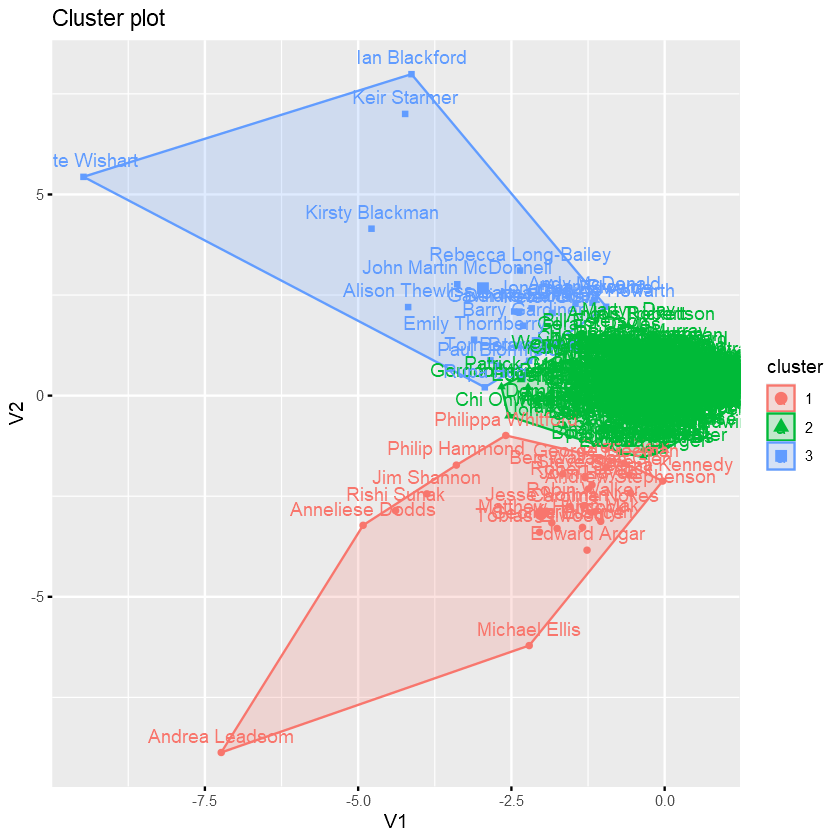

In [22]:
## filter
outliers <- c("Jeremy Corbyn", "Valerie Vaz")
dtm <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp[!(corp$doc_id %in% outliers), ]
  )),
  control = list(
    language = "english",
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)

## repeat lsa/km
ls <- lsa(dtm, 2)
pcs <- as.data.frame(ls$tk)
M <- as.textmatrix(ls)
km <- kmeans(pcs, centers = 3)
fviz_cluster(km, data = pcs)

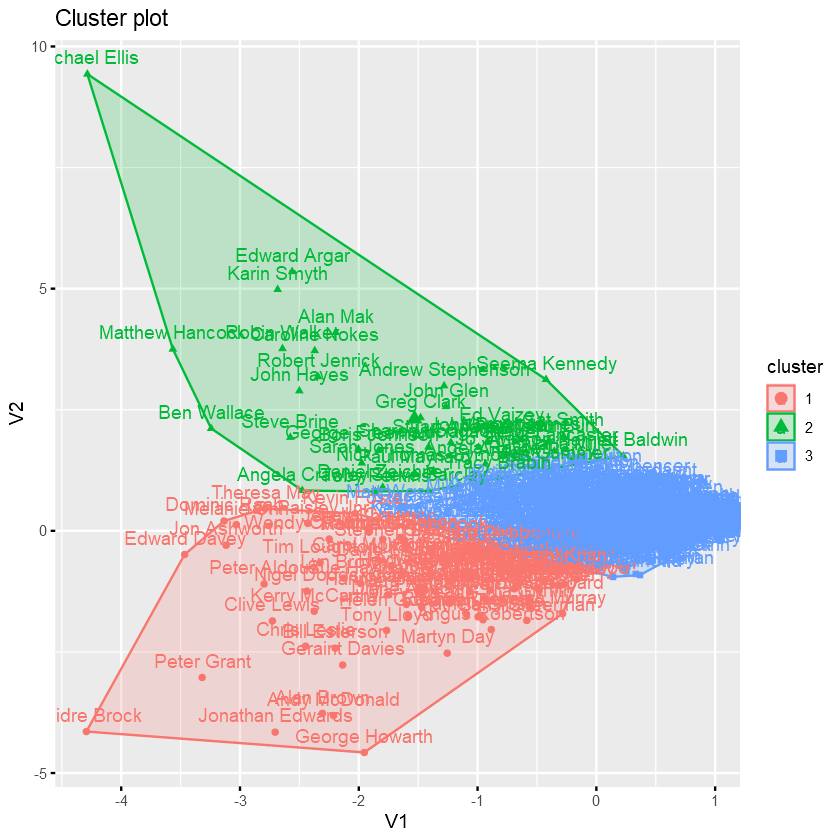

In [23]:
## filter even more
dtm <- DocumentTermMatrix(
  Corpus(DataframeSource(
    corp[brexit.speakers$wordcount < quantile(brexit.speakers$wordcount, p = 0.95), ]
  )),
  control = list(
    language = "english",
    weighting = weightTf,
    tolower = TRUE,
    removePunctuation = TRUE,
    removeNumbers = TRUE,
    stopwords = TRUE,
    stemming = FALSE,
    wordLengths = c(3, Inf)
  )
)

## repeat lsa/km
ls <- lsa(dtm, 2)
pcs <- as.data.frame(ls$tk)
M <- as.textmatrix(ls)
km <- kmeans(pcs, centers = 3)
fviz_cluster(km, data = pcs)

In [24]:
## sampling, adding document length as a column, ...


In [25]:
## do the clusters identify party membership?
## ...

## Word embeddings

### Preparation and estimation

In [26]:
## use untransformed or only minimally transformed text as input
text <- brexit.debates$body.orig
text <- replace_html(text)
text <- replace_non_ascii(text)
text <- gsub("&#[0-9]{3,4};", " ", text)
## text <- replace_ordinal(text, num.paste = TRUE)
## text <- replace_number(text, remove = TRUE)
## text <- replace_contraction(text)
## text <- add_comma_space(text)
## text <- replace_white(text)
text <- tolower(text)

In [27]:
## train word2vec to learn embeddings
## vsmodel <- word2vec(x = text, type = "skip-gram", dim = 150, iter = 20)

## save model to file
## write.word2vec(vsmodel, "Data/w2v-brexit.bin")

In [28]:
## read again (save time)
vsmodel <- read.word2vec("Data/w2v-brexit.bin")

In [29]:
## all terms
terms <- summary(vsmodel, "vocabulary")

In [30]:
## extract embeddings
embeddings <- as.matrix(vsmodel)
dim(embeddings)
head(embeddings)


[1] 8846  150

minimal,0.23841791,-0.79727352,0.9123803,-0.05928565,-0.9802403,0.3305009,0.48888206,-1.5740004,-0.5864147,-1.4658293,...,-1.4969993,-2.32244992,1.1544501,-0.1694336,0.9602389,-1.0720338,0.5405620,0.31633878,-0.10705677,-0.65007573
calais,-0.36391467,-1.06466675,1.0210068,0.39895365,-0.4369816,0.5543187,0.14843225,1.4516176,-0.3616192,-1.2365022,...,0.2038682,-0.25007135,0.6860014,-0.4213192,-0.1655789,1.6283263,-1.5732877,0.09942484,0.02224266,1.28063691
construct,0.24802509,1.02443039,0.9623402,1.08967423,0.4311689,0.9041682,1.32761383,0.1672523,1.6035303,-0.4300559,...,0.1600953,-0.01460068,0.9764130,0.3333281,-1.8488169,0.5418165,-0.7913830,-1.01045156,1.24267828,-0.62326628
commended,-0.09518667,0.38729253,-1.1231937,0.10887074,-0.9958499,0.7452741,0.96078575,0.2071699,0.6832874,-0.1769654,...,-1.4644920,-0.01925289,0.7344257,-0.5352449,0.1971209,-0.1759323,-0.1385970,-0.11990546,-0.94705826,0.18890877
complacency,0.63887221,0.45029661,0.5307997,-1.09213769,-0.4350112,0.9784605,0.95929241,-0.7331046,0.4257580,0.9456663,...,-0.2774202,-0.02057776,1.7333139,0.3326592,0.2589859,-0.4272937,-0.8413697,-0.33017048,-1.31802320,1.89422381
altogether,1.53805530,-0.09739055,1.0886612,2.28247190,0.6615224,-0.4954870,0.02663931,1.9585826,-0.3213061,-0.6418970,...,0.3501922,-1.18671143,0.6272132,0.1631336,-2.1517644,-0.9056929,0.7982913,1.72704029,1.10297394,-0.02225971


### Semantics and similarity

In [31]:
## some word associations
predict(vsmodel, c("johnson", "corbyn", "bercow", "may", "starmer", "cummings"),
        type = "nearest", top_n = 5)

term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
johnson,uxbridge,0.8164946,1
johnson,ruislip,0.8149032,2
johnson,diana,0.7649225,3
johnson,boris,0.7349076,4
johnson,haltemprice,0.7023653,5
term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
corbyn,islington,0.8871717,1
corbyn,jeremy,0.7683743,2


In [32]:
predict(vsmodel, c("negotiations", "deadline", "vote", "fisheries"),
        type = "nearest", top_n = 5)

term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
negotiations,negotiation,0.7214487,1
negotiations,negotiating,0.7145054,2
negotiations,brexit,0.7085007,3
negotiations,relationship,0.6698551,4
negotiations,outcome,0.6691886,5
term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
deadline,exits,0.6854978,1
deadline,unclear,0.6853690,2


In [53]:
## analogy tasks (better with pre-trained embeddings in a different context)
wv <- predict(vsmodel, newdata = c("uk", "continent", "eu"), type = "embedding")
wv <- wv["uk", ] - wv["eu", ] + wv["continent", ]
predict(vsmodel, newdata = wv, type = "nearest", top_n = 5)

term,similarity,rank
<chr>,<dbl>,<int>
uk,0.8580805,1
world,0.8156021,2
spreading,0.7906542,3
globe,0.7714295,4
country,0.7522721,5


In [34]:
## associations: uk without europe
wv <- embeddings["uk", ] - embeddings["europe", ]
predict(vsmodel, newdata = wv, type = "nearest", top_n = 5)

term,similarity,rank
<chr>,<dbl>,<int>
uk,0.7333327,1
required,0.5923838,2
currently,0.5870677,3
competitiveness,0.5672724,4
bill,0.5553861,5


In [35]:
##  associations: brexit with agreement
wv <- embeddings["brexit", ] + embeddings["agreement", ]
predict(vsmodel, newdata = wv, type = "nearest", top_n = 10)

term,similarity,rank
<chr>,<dbl>,<int>
trade,0.9880177,1
deal,0.9733157,2
negotiations,0.9723204,3
customs,0.9297595,4
eu,0.9181033,5
union,0.9170207,6
avoids,0.9093466,7
negotiate,0.8973730,8
backstop,0.8889552,9


In [36]:
##  associations: brexit without agreement
wv <- embeddings["brexit", ] - embeddings["agreement", ]
predict(vsmodel, newdata = wv, type = "nearest", top_n = 10)

term,similarity,rank
<chr>,<dbl>,<int>
brexit,0.8453148,1
chaotic,0.6748271,2
light,0.6282534,3
inflict,0.6219254,4
shortages,0.6121505,5
headlines,0.6110391,6
heading,0.6020859,7
leaflet,0.5983779,8
post,0.5958458,9


In [37]:
#==================== Project all adjectives in 2 dimensions ===================

## pos-tag the text to identify adjectives, takes quite a while, read already annotated file instead
## corp <- brexit.debates[, c("gid", "body.orig")]
## setnames(corp, "gid", "doc_id")
## setnames(corp, "body.orig", "text")
## corp$text <- text
## corp.pos <- udpipe(corp, "english")
## saveRDS(corp.pos, "Data/brexit-annotated.rds")
corp.pos <- readRDS("Data/brexit-annotated.rds")
head(corp.pos)

,doc_id,paragraph_id,sentence_id,sentence,start,end,term_id,token_id,token,lemma,upos,xpos,feats,head_token_id,dep_rel,deps,misc
,<chr>,<int>,<int>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,1,2,1,1,it,it,PRON,PRP,Case=Nom|Gender=Neut|Number=Sing|Person=3|PronType=Prs,4,expl,NA,NA
2,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,4,5,2,2,is,be,AUX,VBZ,Mood=Ind|Number=Sing|Person=3|Tense=Pres|VerbForm=Fin,4,cop,NA,NA
3,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,7,7,3,3,a,a,DET,DT,Definite=Ind|PronType=Art,4,det,NA,NA
4,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,9,16,4,4,pleasure,pleasure,NOUN,NN,Number=Sing,0,root,NA,NA
5,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,18,19,5,5,to,to,PART,TO,NA,6,mark,NA,NA
6,2020-07-22c.2213.0,1,1,it is a pleasure to follow the hon.,21,26,6,6,follow,follow,VERB,VB,VerbForm=Inf,4,acl,NA,NA


In [38]:
## get all adjectives in the corpus
length(unique(corp.pos[, "token"]))
length(unique(corp.pos[corp.pos$upos == "ADJ", "token"]))
adjectives <- unique(corp.pos[corp.pos$upos == "ADJ", "token"])

[1] 23923

[1] 4627

In [39]:
## get all nouns in the corpus
length(unique(corp.pos[, "token"]))
length(unique(corp.pos[corp.pos$upos == "NOUN", "token"]))
nouns <- unique(corp.pos[corp.pos$upos == "NOUN", "token"])

[1] 23923

[1] 14247

In [40]:
# visualize 2-dimensional projection of all adjectives in the brexit debate data
# project on 2dim space
viz <- umap(embeddings, n_neighbors = 15, n_threads = 2)
# filter for adjectives
df  <- data.frame(word = rownames(embeddings),
                  xpos = rownames(embeddings),
                  x = viz[, 1], y = viz[, 2],
                  stringsAsFactors = FALSE)
df  <- subset(df, xpos %in% adjectives)
head(df)

,word,xpos,x,y
,<chr>,<chr>,<dbl>,<dbl>
1,minimal,minimal,-1.98477530,-0.54317864
5,complacency,complacency,-0.18712351,0.54271165
9,abingdon,abingdon,-0.05167016,-2.19372245
12,whereby,whereby,-2.00123763,0.28597061
21,sammy,sammy,4.18949354,1.51179373
23,tested,tested,-1.85045636,-0.09835609


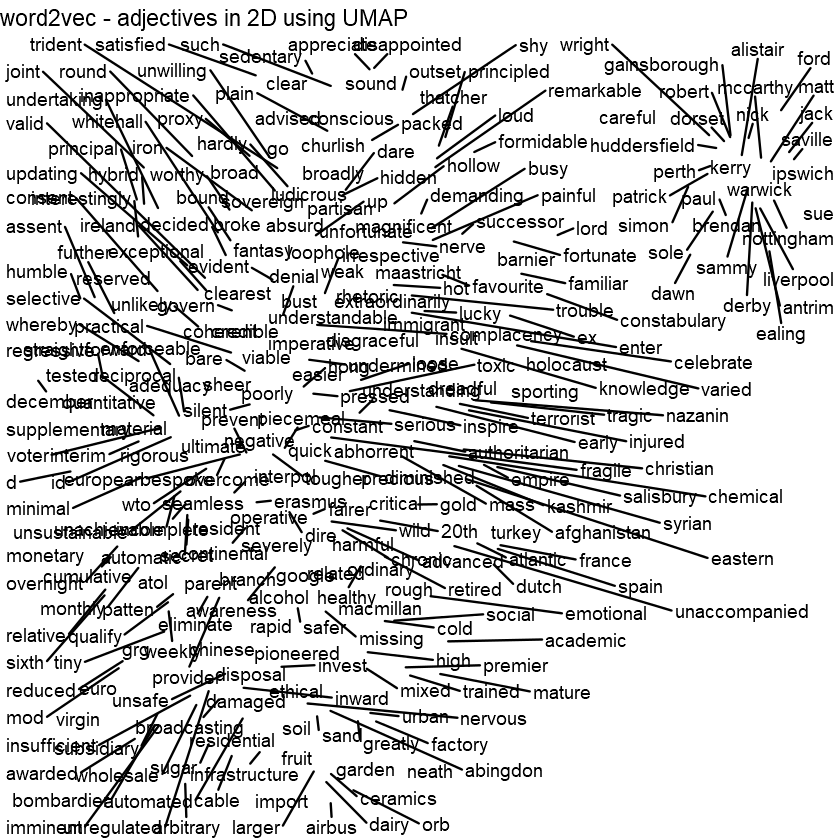

In [41]:
## Plot, restrict to first 300 for speed
ggplot(df[1:300, ], aes(x = x, y = y, label = word)) +
  geom_text_repel() + theme_void() +
  labs(title = "word2vec - adjectives in 2D using UMAP")

In [55]:
## Interactive plot
plot_ly(df[1:300, ], x = ~x, y = ~y, type = "scatter", mode = 'text', text = ~word)

HTML widgets cannot be represented in plain text (need html)

In [43]:
#======================= Similar projection of all nouns =======================

embeddings.nouns <- predict(vsmodel, nouns, type = "embedding")
embeddings.nouns <- embeddings.nouns[complete.cases(embeddings.nouns), ]
viz <- umap(embeddings.nouns, n_neighbors = 15, n_threads = 2)
df  <- data.frame(word = rownames(embeddings.nouns),
                  xpos = rownames(embeddings.nouns),
                  x = viz[, 1], y = viz[, 2],
                  stringsAsFactors = FALSE)
plot_ly(df[1:500, ], x = ~x, y = ~y, type = "scatter", mode = 'text', text = ~word)

HTML widgets cannot be represented in plain text (need html)

### Pre-trained embeddings

In [44]:
## Download word2vec, glove or fasttext embeddings
## https://github.com/maxoodf/word2vec
## https://fasttext.cc/docs/en/crawl-vectors.html
## https://nlp.stanford.edu/projects/glove/

In [45]:
## word2vec on English texts corpus, Skip-Gram, Negative Sampling, vector size 500, window 10
model <- read.word2vec(file = "Data/sg_ns_500_10.w2v", normalize = TRUE)
length(summary(model))

[1] 437107

In [46]:
## Examples for word similarities, classical analogies and embedding similarities
predict(model, newdata = c("loan", "money"), type = "nearest", top_n = 5)

term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
loan,loans,0.8613834,1
loan,refinance,0.7948905,2
loan,lenders,0.7914505,3
loan,borrowers,0.7914087,4
loan,borrower,0.7913249,5
term1,term2,similarity,rank
<chr>,<chr>,<dbl>,<int>
money,funds,0.8276913,1
money,sums,0.8161772,2


In [47]:
wv <- predict(model, newdata = c("king", "man", "woman"), type = "embedding")
wv <- wv["king", ] - wv["man", ] + wv["woman", ]
predict(model, newdata = wv, type = "nearest", top_n = 5)

term,similarity,rank
<chr>,<dbl>,<int>
king,0.9663149,1
alveda,0.7624112,2
leonowens,0.7437726,3
sobhuza,0.7369328,4
queen,0.7323185,5


In [48]:
wv <- predict(model, newdata = c("physician", "man", "woman"), type = "embedding")
wv <- wv["physician", ] - wv["man", ] + wv["woman", ]
predict(model, newdata = wv, type = "nearest", top_n = 20)

term,similarity,rank
<chr>,<dbl>,<int>
physicians,0.9161485,1
gynecologist,0.8723261,2
doctors,0.8701000,3
doctor,0.8684908,4
ob/gyns,0.8614113,5
anesthetists,0.8587450,6
gyns,0.8579593,7
obgyn,0.8574644,8
obstetrician,0.8532575,9


In [49]:
wv <- predict(model, newdata = c("black", "white", "racism", "person"), type = "embedding")
wv <- wv["white", ] - wv["person", ] + wv["racism", ]
predict(model, newdata = wv, type = "nearest", top_n = 10)

term,similarity,rank
<chr>,<dbl>,<int>
racist,0.9080503,1
black,0.8907195,2
racial,0.8862036,3
racially,0.8547922,4
racists,0.8485892,5
afrikaaners,0.8200302,6
segregationists,0.7985599,7
coloreds,0.7980393,8
colorism,0.7970777,9


In [50]:
wv <- predict(model, newdata = c("black", "white", "racism", "person"), type = "embedding")
wv <- wv["white", ] - wv["person", ] + wv["racism", ]
predict(model, newdata = wv, type = "nearest", top_n = 10)

term,similarity,rank
<chr>,<dbl>,<int>
racist,0.9080503,1
black,0.8907195,2
racial,0.8862036,3
racially,0.8547922,4
racists,0.8485892,5
afrikaaners,0.8200302,6
segregationists,0.7985599,7
coloreds,0.7980393,8
colorism,0.7970777,9
